### Load Libraries

In [1]:
import numpy as np
import cv2
import collections
import glob
import os
import pickle
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

from moviepy.editor import VideoFileClip
from IPython.display import HTML

%matplotlib inline

### Utility Plotting Functions

In [2]:
def plot_image(img, title=None, cmap=None, axes='off', figsize=(8,8)):
    """
    Plot 1 image with optional title, color map, and axes.
    """
    fig, (ax1) = plt.subplots(1, 1, figsize=figsize)
    fig.tight_layout()

    ax1.imshow(img, cmap=cmap)
    ax1.axis(axes)
    if title:
        ax1.set_title(title)


def plot_sxs(img_l, img_r, title_l=None, title_r=None, cmap_l=None, cmap_r=None, axes='off', figsize=(20,10)):
    """
    Plot 2 images side by side with optional titles, color maps, and axes.
    """
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)
    fig.tight_layout()

    ax1.imshow(img_l, cmap=cmap_l)
    ax1.axis(axes)
    if title_l:
        ax1.set_title(title_l)
    
    ax2.imshow(img_r, cmap=cmap_r)
    ax2.axis(axes)
    if title_r:
        ax2.set_title(title_r)

### Load camera calibration data computed in Step 1 Notebook

In [3]:
with open('calibration.pkl', 'rb') as file:
    dist_pickle=pickle.load(file)
    
calibration_mtx=dist_pickle['mtx']
calibration_dist=dist_pickle['dist']

Use camera calibration data to undistort a test image.  You can see changes in closer to the edges of the image (as epxected) such as the shape of the hill to the left, as well as at the bottom.

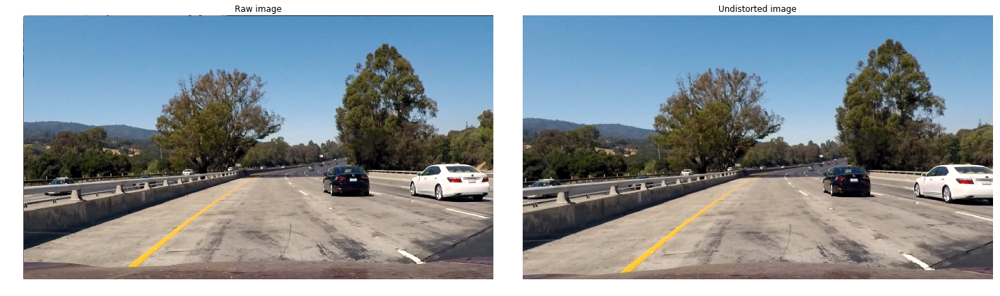

In [4]:
image = mpimg.imread('test_images/test1.jpg')
undist = cv2.undistort(image, calibration_mtx, calibration_dist, None, calibration_mtx)

plot_sxs(image, undist, 'Raw image', 'Undistorted image')

### Set up test image set

In [5]:
# load test images for testing with during each step of pipeline

test_image_paths = glob.glob('test_images/*.jpg')
# Load test images
test_images = [mpimg.imread(p) for p in test_image_paths]
# Undistort test images
undist_images = [cv2.undistort(image, calibration_mtx, calibration_dist, None, calibration_mtx) for image in test_images]

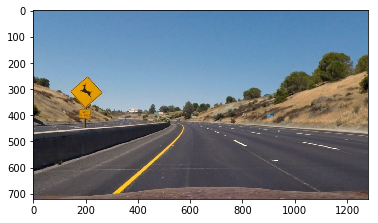

In [6]:
# Show a random undistorted test image
plt.imshow(undist_images[3])

### Perspective Transformation

In [7]:
def warp_coordinates(image):
    """
    Get the image warping coordinates for translating between camera
    image and bird's eye image.
    
    The coordinates are manually tuned to map a trapezoidal region in
    a straight road.
    """
    src = np.float32([[260, 680], [585, 456], [700, 456], [1043, 680]])
    top_left = np.array([src[0, 0], 0])
    top_right = np.array([src[3, 0], 0])
    offset = [50, 0]        
    dst = np.float32([src[0] + offset, top_left + offset, top_right - offset, src[3] - offset])

    return src, dst

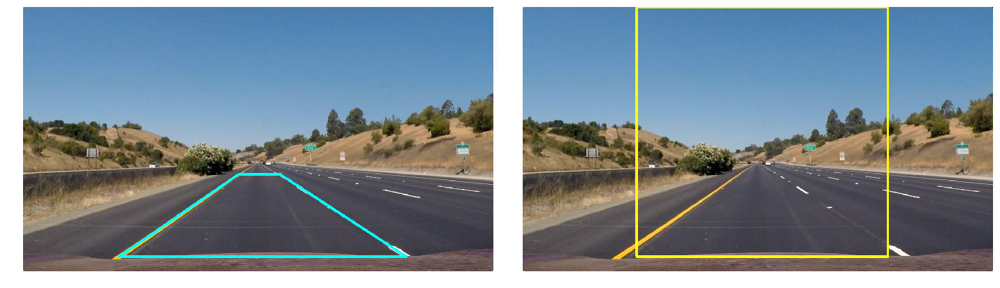

In [8]:
# Use one of the straight line images to test with
image = test_images[0]

src, dst = warp_coordinates(image)

# Draw the warp cooridnates for reference
src_image = image.copy()
src_pts = src.reshape((-1, 1, 2)).astype('int32')
cv2.polylines(src_image, [src_pts], True, (0, 255, 255), thickness=5)

dst_image = image.copy()
dst_pts = dst.reshape((-1, 1, 2)).astype('int32')
cv2.polylines(dst_image, [dst_pts], True, (255, 255, 0), thickness=5)

plot_sxs(src_image, dst_image)

### Get the perspective transform matrices

In [9]:
# Get forward and inverse transforms
# Inverse transform will be used later on 

warp_M=cv2.getPerspectiveTransform(src, dst)
warp_Minv=cv2.getPerspectiveTransform(dst, src)

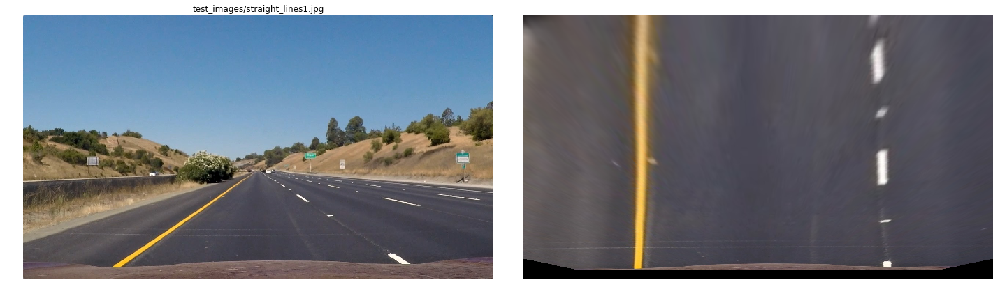

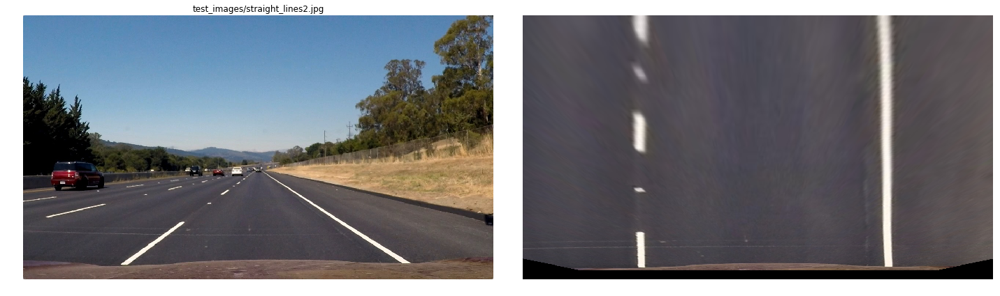

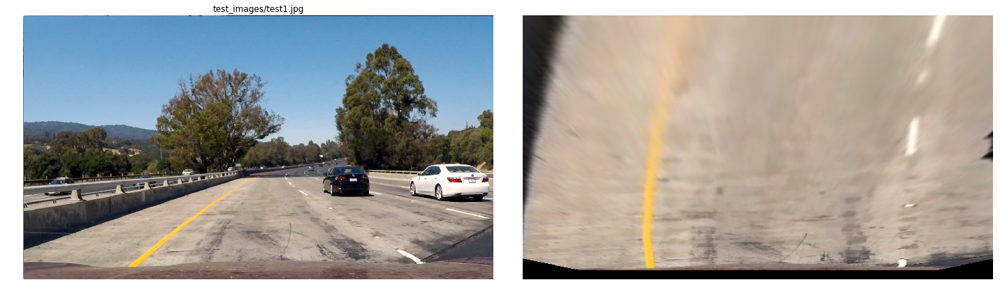

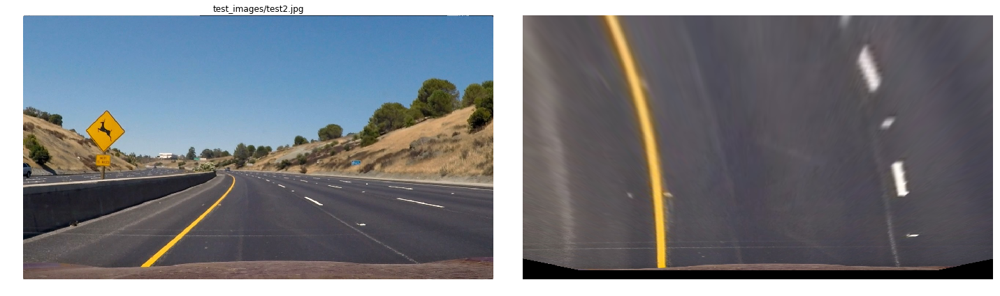

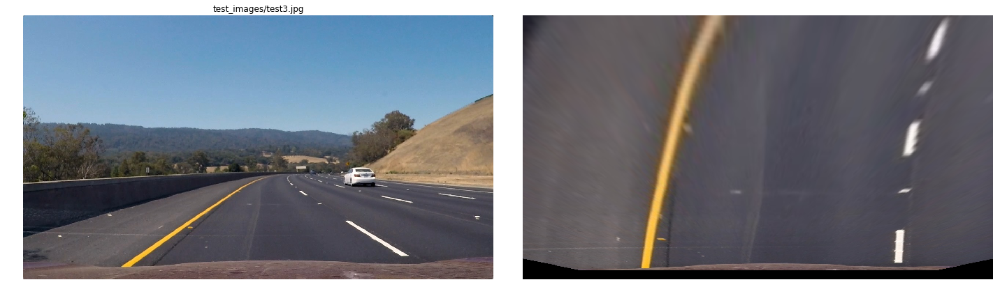

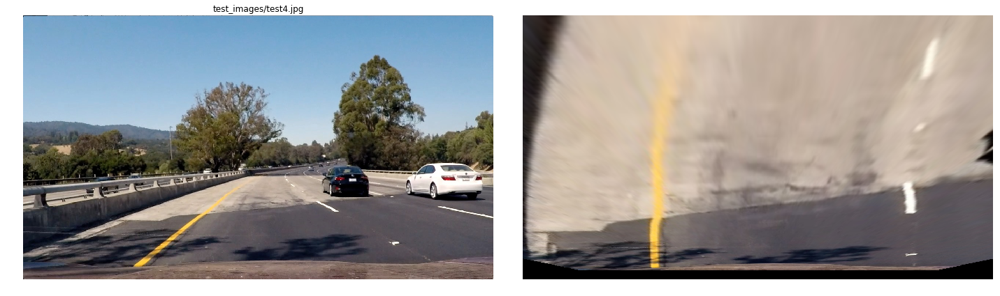

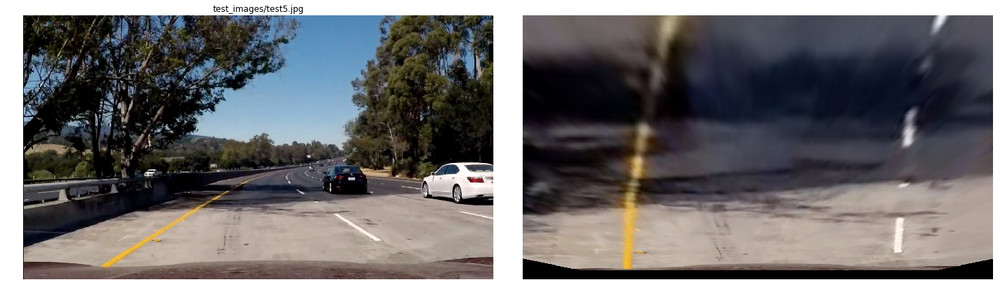

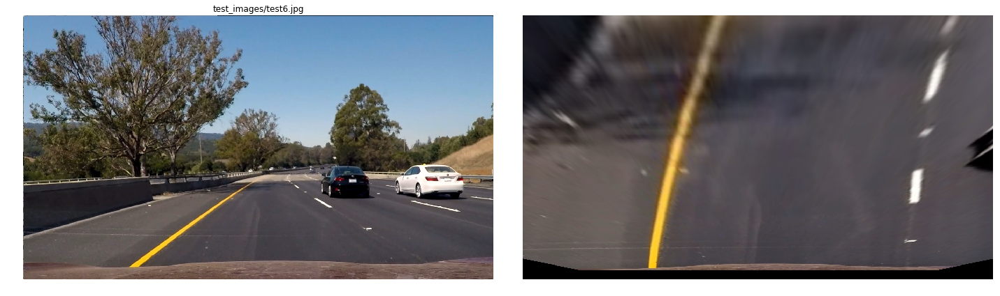

In [10]:
# Test the perspective tranform on all the test images
warped_images = [cv2.warpPerspective(image, warp_M, image.shape[0:2][::-1], flags=cv2.INTER_LINEAR) 
                 for image in undist_images]

for i in range(len(warped_images)):
    plot_sxs(test_images[i], warped_images[i], title_l=test_image_paths[i])

### Test masking image to region of interest

We test using a trapezoidal region of interest to mask the image.

In [11]:
def region_of_interest(img, vertices):
    """
    Applies an image mask to a region of interest.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

We discover that at least for the test images, using a the trapezoidal region of interest to mask the image still retains a lot of noise in the image.  Therefore, its utility appears limited for this application.

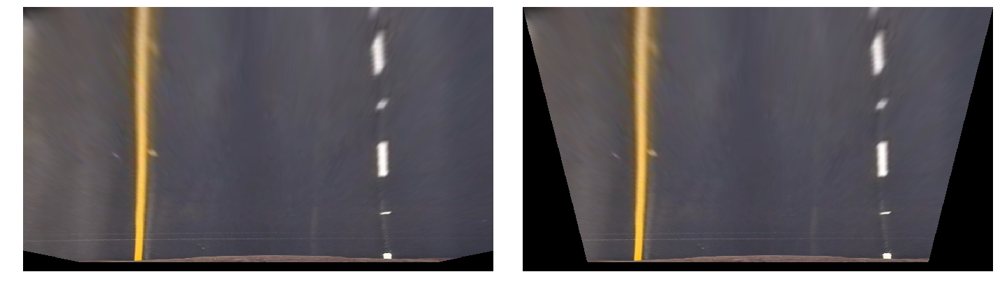

In [12]:
# Test region of interest on a test image
image = warped_images[0]

shape = image.shape
vertices = np.array([[(0,0),(shape[1],0),(shape[1],0),(6*shape[1]/7,shape[0]),
                  (shape[1]/7,shape[0]), (0,0)]],dtype=np.int32)

masked = region_of_interest(image, vertices)

plot_sxs(image, masked)

### Apply image transforms with gradient and HLS thresholds

In [13]:
def threshold_image(img, sx_thresh=(20, 255), l_thresh=(40,255), s_thresh=(120, 255)):
    """
    Apply gradient and HLS image thresholds to image to simplify lane line detection.
    """
    # Cconvert image to HLS color space to enable thresholding on saturation and light
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    h_channel = hls[:,:,0]
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]

    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0)
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255 * abs_sobelx / np.max(abs_sobelx))

    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1

    # Threshold saturation channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1

    # Threshold lightness channel
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh[0]) & (l_channel <= l_thresh[1])] = 1

    binary = np.zeros_like(sxbinary)
    binary[((l_binary == 1) & (s_binary == 1) | (sxbinary==1))] = 1

    return  binary

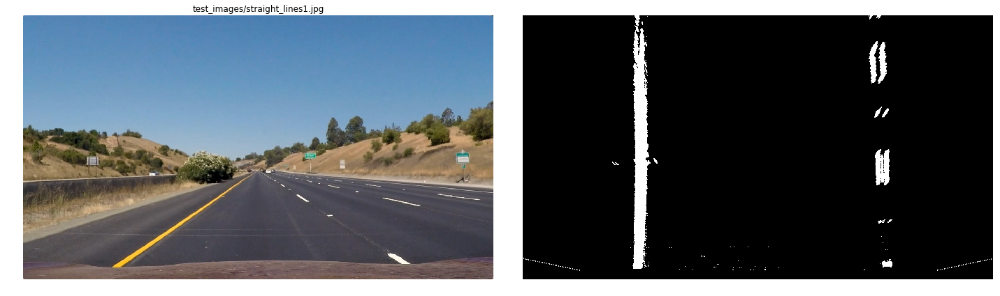

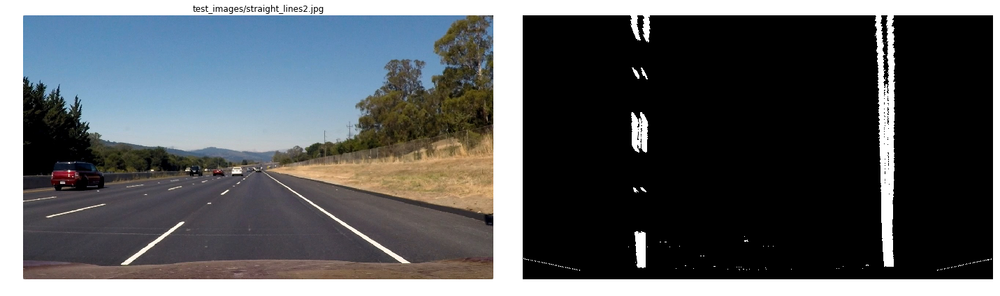

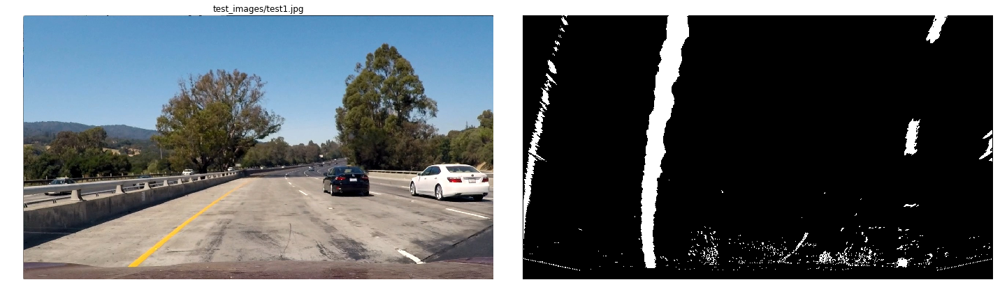

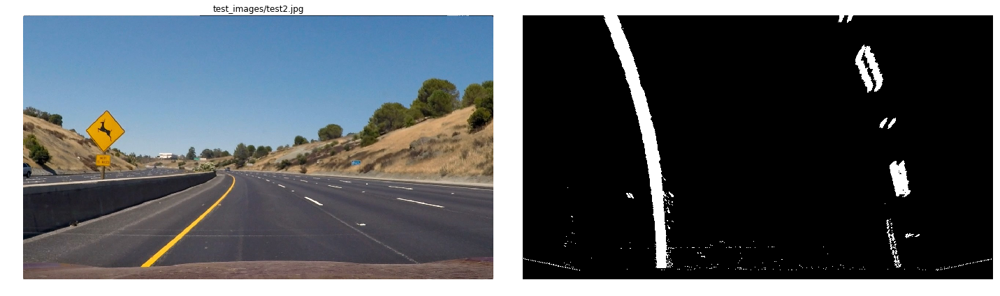

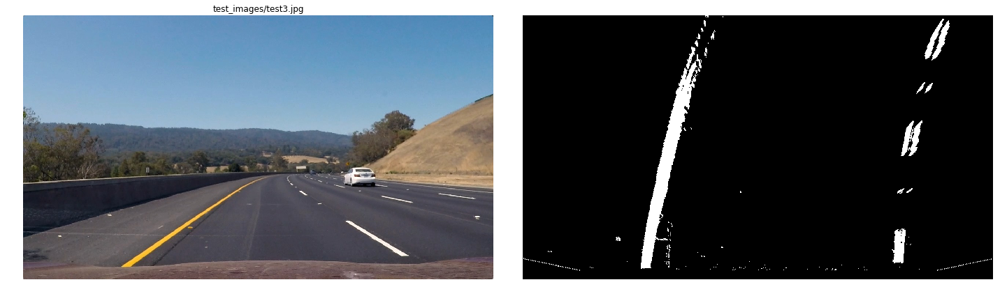

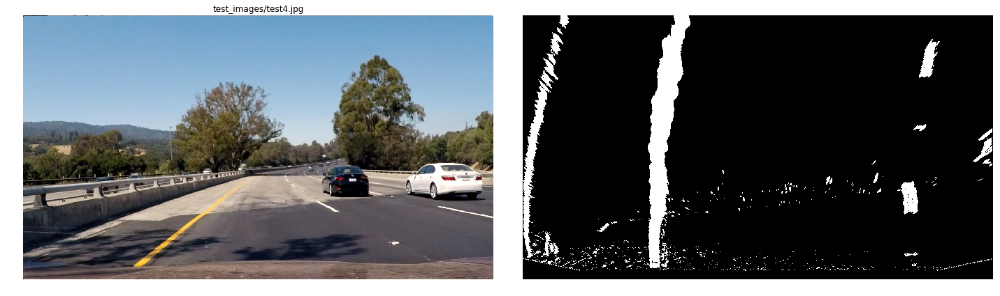

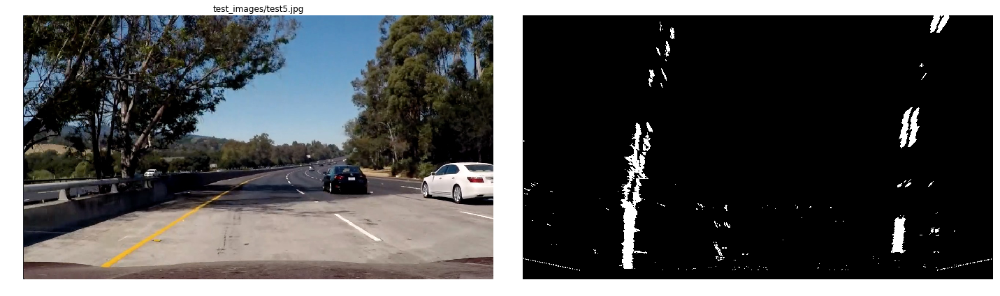

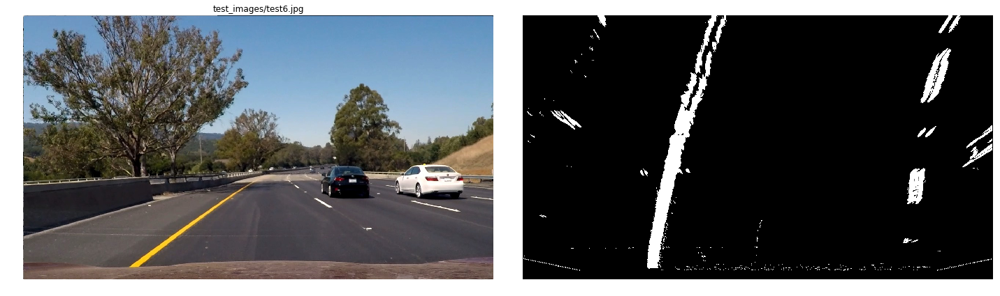

In [14]:
# Test the thresholding on all the test images
thresholded_images = [threshold_image(image) for image in warped_images]

for i in range(len(test_images)):
    plot_sxs(test_images[i], thresholded_images[i], title_l=test_image_paths[i], cmap_r='gray')

### Apply histogram to detect where most pixels are 'lit up' in the thresholded image

We thresholded the image so that it will be most 'lit up' where lane lines are.

Histogram is applied to bottom half of image.

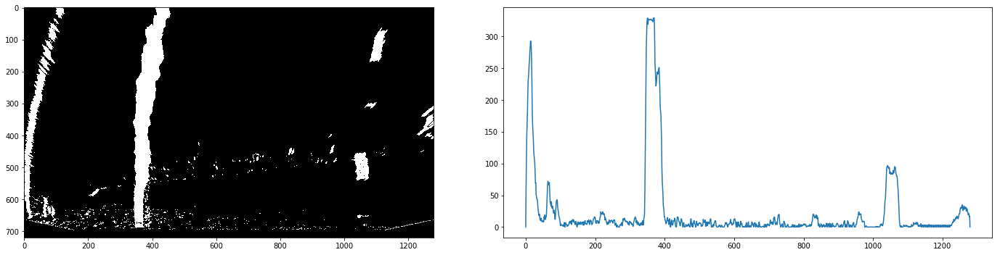

In [15]:
# Show histogram on a test image
image = thresholded_images[5]
histogram = np.sum(image[image.shape[0]//2:,:], axis=0)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,5))
f.tight_layout()

ax1.imshow(image, cmap='gray')
ax2.plot(histogram)

In [24]:
histogram

array([  0,  60, 107, ...,  16,  17,   0], dtype=uint64)

In [26]:
midpoint=len(histogram) // 2

In [27]:
lefth = histogram[:midpoint]

In [37]:
righth=histogram[midpoint:]

In [32]:
leftc = np.convolve(lefth, np.ones(15), 'same')

In [34]:
np.argmax(leftc)

363

In [38]:
rightc= np.convolve(lefth, np.ones(15), 'same')

In [40]:
np.argmax(rightc)+midpoint

1003

In [41]:
np.argmax(lefth)

351

In [43]:
np.argmax(righth)+midpoint

1042

### Lane Detection

In this section we define lane detection algorithms.

This includes full image sliding window search, and region-of-interest search using last detected lane positions.

We also define curvature algorithm here as it can be used for outlier detection.

In [16]:
### Global state variables - these keep state in running the lane detection
# Current frame in video - used to compute averages and for debugging
frame = 0
# The total of detected lane widths - used to compute average lane width
total_lane_width = 0

# The left lane line
left_line = None
# The right lane line
right_line = None

# Image shape
image_shape = None
# Vector of range of y values used in computing lane points
yrange = None
# Height of scene in meters
scene_height = None
# Width of scene in meters
scene_width = None


### Global hyperparameters
# Meters per pixel in y dimension
ym_per_pix = 30/720 
# Meters per pixel in x dimension
xm_per_pix = 3.7/700 

# Number of detected frames to keep for smoothing the lane detection 
smoothing_window_size = 6
# Smoothing weights - weight recent frames more
smoothing_weights = np.square(np.linspace(0.1, 1.0, num=smoothing_window_size))[::-1]

# Absolute value of how far the car can deviate from center of lane 
# before the detected lanes can be considered an outlier
max_lane_deviation = 1.0

# How far the detected lane width can deviate from average 
# before the detected lanes can be considered an outlier
# We use ratio as absolute lane width varies between the videos
min_lane_width_ratio = 0.8
max_lane_width_ratio = 1.2

In [17]:
def get_curvature(leftx, lefty, rightx, righty, yrange, image_size):
    """
    Compute the curvature of both lanes.
    Also compute the deviation from center of the car, and the computed lane width.
    """
    y_eval = np.max(yrange)
        
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    # Now our radius of curvature is in meters
    # Example values: 632.1 m    626.2 m
    
    # Calculate Lane Deviation from center of lane:
    # First we calculate the intercept points at the bottom of our image, then use those to 
    # calculate the lane deviation of the vehicle (assuming camera is in center of vehicle)    
    left_intercept = left_fit_cr[0] * scene_height ** 2 + left_fit_cr[1] * scene_height + left_fit_cr[2]
    right_intercept = right_fit_cr[0] * scene_height ** 2 + right_fit_cr[1] * scene_height + right_fit_cr[2]
    calculated_center = (left_intercept + right_intercept) / 2.0
    lane_width = right_intercept - left_intercept
    
    lane_deviation = (calculated_center - scene_width / 2.0)
    
    return left_curverad, right_curverad, lane_deviation, lane_width

In [18]:
# Define Line object to store state

class Line():
    def __init__(self):
        # Was the line detected in the last iteration?
        self.detected = False  
        
        # Indices of detected pixels in current frame
        self.indices = None
        # deque of polynomial coefficients
        self.fit_que = collections.deque([], smoothing_window_size)
        # Current average fit
        self.avg_fit = None
        # Current average fit values
        self.avg_fitx = None
        # Radius of curvature of the line
        self.radius = None 
        
        ### DEBUG INFORMATION
        # Frames where search was restarted
        self.restart_frames = []        


In [44]:
### The actual lane detection algorithm

def init_lines():
    """
    Initialize global state for lane line detection.
    Create and initialize left and right lane line objects.
    """
    global left_line, right_line, frame, total_lane_width
    frame = 0
    total_lane_width = 0
    # Reset left and right lanes to new objects
    left_line = Line()
    right_line = Line()

    
def init_global_params(image):
    """
    Compute and cache global parameters that depend on the image size.
    This is called by process_image once at start of video processing.
    """
    global image_shape, yrange, scene_height, scene_width
    image_shape = image.shape
    yrange = np.linspace(0, image_shape[0]-1, image_shape[0])
    scene_height = image_shape[0] * ym_per_pix
    scene_width = image_shape[1] * xm_per_pix
    

def anomalous_lane_width(lane_width):
    """
    Return true if lane width is too wide or too narrow relative to average
    """
    avg = total_lane_width / (frame + 1)  # frame starts at 0
    if lane_width < avg * min_lane_width_ratio:
        return True
    if lane_width > avg * max_lane_width_ratio:
        return True
    return False

        
def lane_search(image, debug=False):
    """
    Search for lanes in image.
    
    if `debug` is true, return image with detected lines.
    Debug image includes sliding windows if full sliding window search was used.
    """
    global left_line, right_line, frame, total_lane_width
    
    # Define local methods for different search modes.
    def full_search():
        """
        Do full image sliding window search.
        """
        nonlocal out_img

        # Compute image histogram
        histogram = np.sum(image[image.shape[0]//2:,:], axis=0)

        # Find the peak of the left and right halves of the histogram
        # These will be the starting point for the left and right lines
        midpoint = np.int(len(histogram)//2)
        left_hist = histogram[:midpoint]
        right_hist = histogram[midpoint:]
        left_conv = np.convolve(left_hist, np.ones(15, dtype=int), 'same')
        right_conv = np.convolve(right_hist, np.ones(15, dtype=int), 'same')
        
        leftx_base = np.argmax(left_conv)
        rightx_base = np.argmax(right_conv) + midpoint

        # Choose the number of sliding windows
        nwindows = 8
        # Set height of windows
        window_height = np.int(image.shape[0]/nwindows)

        # Current positions to be updated for each window
        leftx_current = leftx_base
        rightx_current = rightx_base

        # Set minimum number of pixels found to recenter window
        minpix = 50

        # Initialize structure to keep indices of detected pixels
        left_line_inds = []
        right_line_inds = []

        # Step through the windows one by one
        for window in range(nwindows):
            # Identify window boundaries in x and y (and right and left)
            win_y_low = image.shape[0] - (window+1)*window_height
            win_y_high = image.shape[0] - window*window_height
            win_xleft_low = leftx_current - margin
            win_xleft_high = leftx_current + margin
            win_xright_low = rightx_current - margin
            win_xright_high = rightx_current + margin

            if debug:
                # Draw the windows on the visualization image
                cv2.rectangle(out_img, (win_xleft_low,win_y_low), (win_xleft_high,win_y_high), (0,255,0), 2)
                cv2.rectangle(out_img, (win_xright_low,win_y_low), (win_xright_high,win_y_high), (0,255,0), 2)

            # Identify the nonzero pixels in x and y within the window
            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
                              (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                               (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]

            # Append these indices to the lists
            left_line_inds.append(good_left_inds)
            right_line_inds.append(good_right_inds)

            # If you found > minpix pixels, recenter next window on their mean position
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > minpix:        
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

        # Concatenate the arrays of indices and cache them 
        left_line.indices = np.concatenate(left_line_inds)
        right_line.indices = np.concatenate(right_line_inds)

    def region_search():
        """
        Do lane search only in band around last fit lane lines.
        """
        # Find non zero pixels in band around current fit lane lines
        last_leftx = left_line.avg_fit[0]*(nonzeroy**2) + left_line.avg_fit[1]*nonzeroy + left_line.avg_fit[2]
        left_line.indices = (nonzerox > last_leftx - margin) & (nonzerox < last_leftx + margin) 
        last_rightx = right_line.avg_fit[0]*(nonzeroy**2) + right_line.avg_fit[1]*nonzeroy + right_line.avg_fit[2]
        right_line.indices = (nonzerox > last_rightx - margin) & (nonzerox < last_rightx + margin)
    
    def restart_search():
        """
        Do full search next time
        """
        left_line.detected = False
        right_line.detected = False
        # Store the restarted frames for debugging
        if len(left_line.restart_frames) == 0 or \
            left_line.restart_frames[-1] != frame:
            # Only store a frame once
            left_line.restart_frames.append(frame)
            
    def update_lines(left_fit, right_fit):
        """
        Update the lanes based on currently computed fit.
        Optionally clear the que first.
        """
        left_line.fit_que.appendleft(left_fit)
        right_line.fit_que.appendleft(right_fit)

        # Smoothing weights need to be same size as current size of que
        weights = smoothing_weights[:len(left_line.fit_que)]
        
        left_line.avg_fit = np.average(left_line.fit_que, axis=0, weights=weights)
        right_line.avg_fit = np.average(right_line.fit_que, axis=0, weights=weights)

        # Generate x and y values for plotting
        left_line.avg_fitx = left_line.avg_fit[0]*yrange**2 + left_line.avg_fit[1]*yrange + left_line.avg_fit[2]
        right_line.avg_fitx = right_line.avg_fit[0]*yrange**2 + right_line.avg_fit[1]*yrange + right_line.avg_fit[2]


    # Initialize the debug output image
    if debug:
        out_img = np.dstack((image, image, image))*255
    else:
        out_img = None

    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = image.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Set the width of the windows +/- margin
    margin = 100

    # Logic to decide what method of search to use
    if not left_line.detected or not right_line.detected:
        # If either lane was not detected last time (or this is the first step)
        # then run sliding window search
        full_search()
    else:
        region_search()

    # Start with assumption that a lane was detected
    left_line.detected = True
    right_line.detected = True
    
    # Extract left and right line pixel positions
    leftx = nonzerox[left_line.indices]
    lefty = nonzeroy[left_line.indices] 
    rightx = nonzerox[right_line.indices]
    righty = nonzeroy[right_line.indices]
    
    # Compute curvature and lane deviation
    left_line.radius, right_line.radius, lane_deviation, lane_width = \
        get_curvature(leftx, lefty, rightx, righty, yrange, image_shape)
            
    # If lane width is nonsense (negative value), discard
    if lane_width <= 0:
        restart_search()
        if frame > 0:
            # If we see a negative lane width outlier
            # Increase the total by the average
            # instead of just throwing it out
            total_lane_width += (total_lane_width / frame)
    else:
        total_lane_width += lane_width
    
    # If lane width is outside normal range relative to average, discard
    if anomalous_lane_width(lane_width):
        restart_search()

    # If lane deviation is bigger than certain magnitude (say 1.0m)
    # reset
    if abs(lane_deviation) >= max_lane_deviation:
        restart_search()
    
    # We just use left_line as proxy for detection
    if left_line.detected:
        # Fit a second order polynomial to each
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
        left_fitx = left_fit[0]*yrange**2 + left_fit[1]*yrange + left_fit[2]
        right_fitx = right_fit[0]*yrange**2 + right_fit[1]*yrange + right_fit[2]
        
        # If fit line is not normal (top of right is left of top of left lane), discard
        if right_fitx[0] < left_fitx[0]:
            restart_search()
        else:
            update_lines(left_fit, right_fit)
    
    # Draw nonzero points and the fit polynomial
    if debug:
        out_img[lefty, leftx] = [255, 0, 0]
        out_img[righty, rightx] = [0, 0, 255]
        left_pts=np.dstack((left_line.avg_fitx, yrange)).astype(np.int32)
        right_pts=np.dstack((right_line.avg_fitx, yrange)).astype(np.int32)
        cv2.polylines(out_img, left_pts, False, [255,0,0], 2)
        cv2.polylines(out_img, right_pts, False, [255,0,0], 2)

    return lane_deviation, lane_width, out_img

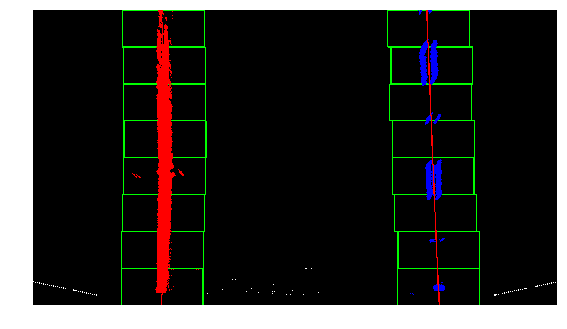

In [45]:
# Test 
init_lines()
init_global_params(thresholded_images[0])
deviation, lane_width, out_img = lane_search(thresholded_images[0], True)
plot_image(out_img)

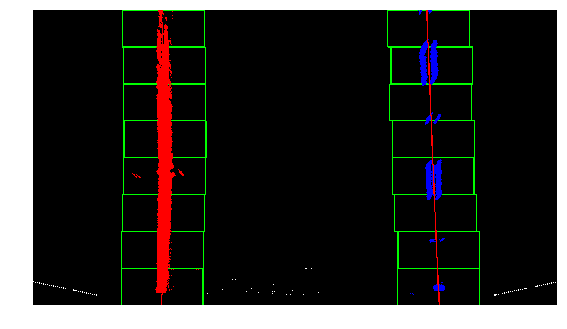

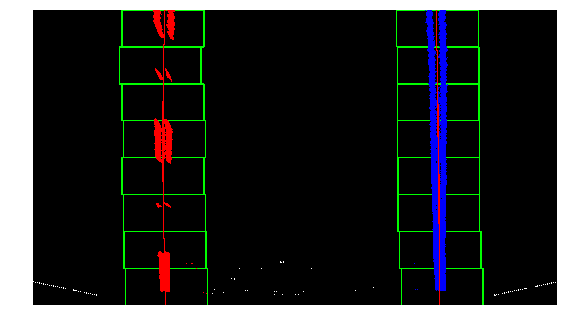

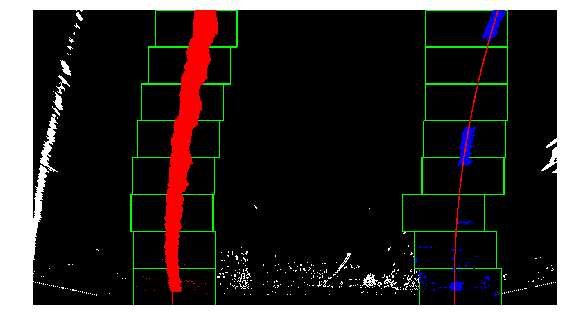

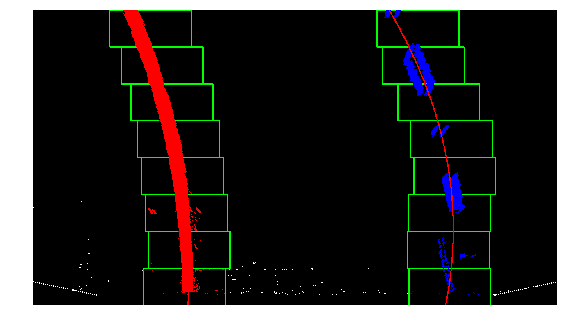

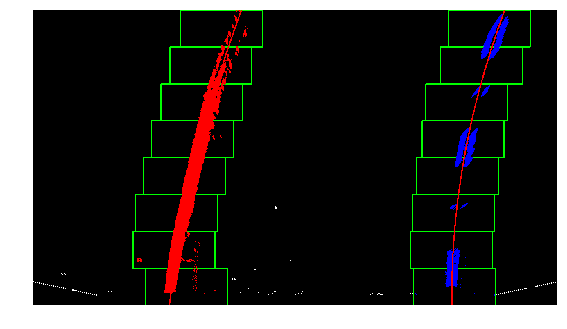

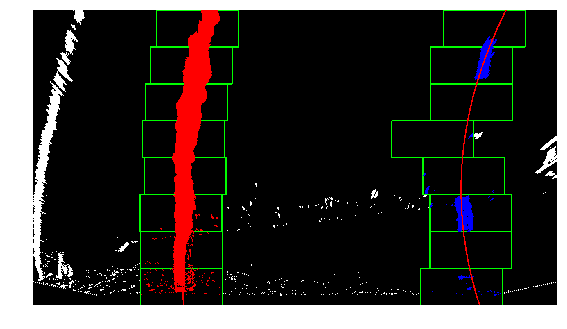

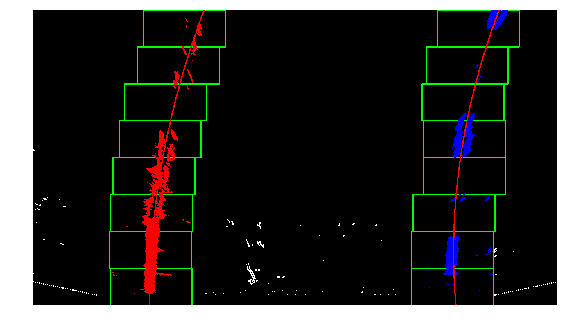

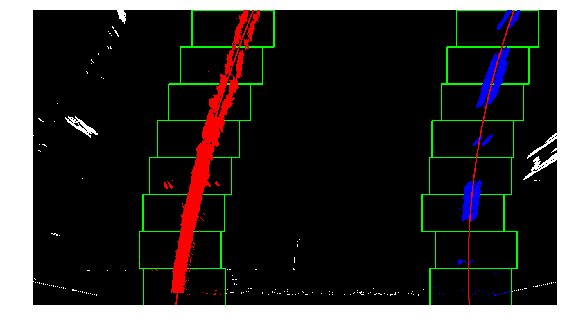

In [46]:
init_global_params(thresholded_images[0])

for image in thresholded_images:
    init_lines()
    deviation, lane_width, out_img = lane_search(image, True)
    plot_image(out_img)

###  Finding lane line pixels in expected region after lanes are detected with full sliding window

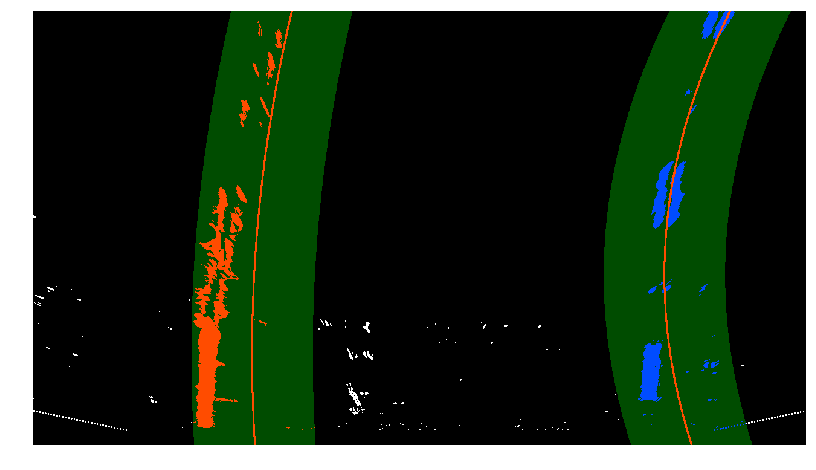

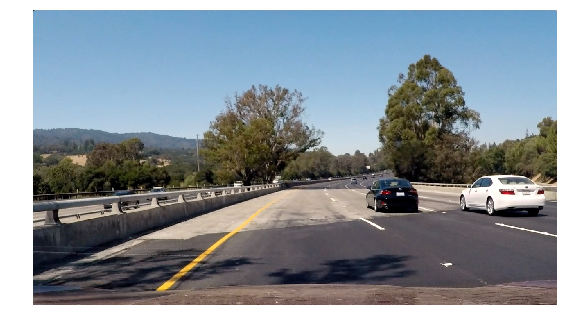

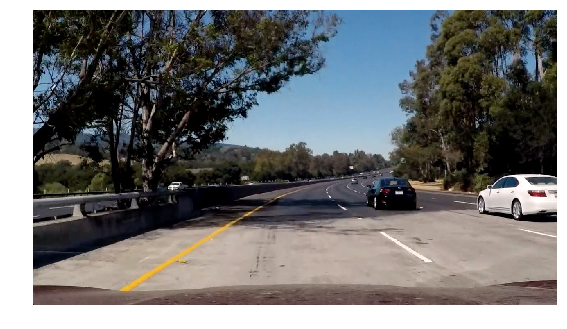

In [47]:
init_lines()

# Initial run will do full window search
dev1, w1, img1 = lane_search(thresholded_images[5], True)
# Next run will use the local saved fit to do region search
dev2, w2, img2 = lane_search(thresholded_images[6], True)

window_img = np.zeros_like(img2)

margin=100

# Generate a polygon to illustrate the search window area
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_line.avg_fitx-margin, yrange]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_line.avg_fitx+margin, yrange])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_line.avg_fitx-margin, yrange]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_line.avg_fitx+margin, yrange])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(img2, 1, window_img, 0.3, 0)

plt.figure(figsize=(16,8))
plt.imshow(result)
plt.xlim(0, 1280)
plt.ylim(720, 0)
plt.axis('off');

plot_image(test_images[5])
plot_image(test_images[6])

In [48]:
def annotate_image(thresholded, raw, lane_deviation, lane_width, frame):
    """
    Draw lanes and information on image
    """
    # Create a blank image to draw the lines on
    warp_zero = np.zeros_like(thresholded).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    if left_line.avg_fitx is not None and right_line.avg_fitx is not None:
        # Recast the x and y points into usable format for cv2.fillPoly()
        pts_left = np.array([np.transpose(np.vstack([left_line.avg_fitx, yrange]))])
        pts_right = np.array([np.flipud(np.transpose(np.vstack([right_line.avg_fitx, yrange])))])
        pts = np.hstack((pts_left, pts_right))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(color_warp, np.int_([pts]), (0, 0, 255))
    
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, warp_Minv, (raw.shape[1], raw.shape[0])) 
    
    # Combine the result with the original image
    image = cv2.addWeighted(raw, 1, newwarp, 0.3, 0)
    
    # Local function for drawing text
    def draw_text(text, pos):
        cv2.putText(image, text, pos, cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2, cv2.LINE_AA)

    draw_text('Frame: {:04d}'.format(frame), (30, 60))
    draw_text('Left curvature: {:.2f}m'.format(left_line.radius), (30, 90))
    draw_text('Right curvature: {:.2f}m'.format(right_line.radius), (30, 120))
    draw_text('Lane offset: {:.2f}m'.format(lane_deviation), (30, 150))
    draw_text('Lane width: {:.2f}'.format(lane_width), (30, 180))

    return image

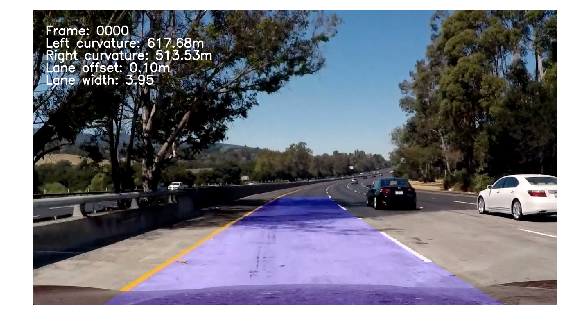

In [49]:
# Test the image annotation
image = thresholded_images[6]

init_lines()
deviation, lane_width, out_img = lane_search(image, True)
result = annotate_image(image, test_images[6], deviation, lane_width, frame)
plot_image(result)

In [50]:
def process_image(image):
    """
    """
    # Initialize global constants the first time around
    global frame
    if frame == 0:
        init_global_params(image)

    undist = cv2.undistort(image, calibration_mtx, calibration_dist, None, calibration_mtx)
    warped = cv2.warpPerspective(undist, warp_M, undist.shape[0:2][::-1], flags=cv2.INTER_LINEAR)
    binary = threshold_image(warped)
    deviation, lane_width, debug_img = lane_search(binary)
    result = annotate_image(binary, image, deviation, lane_width, frame)

    frame += 1

    return result

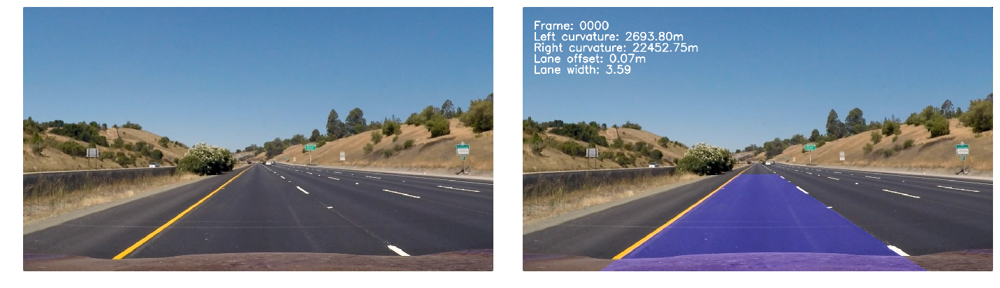

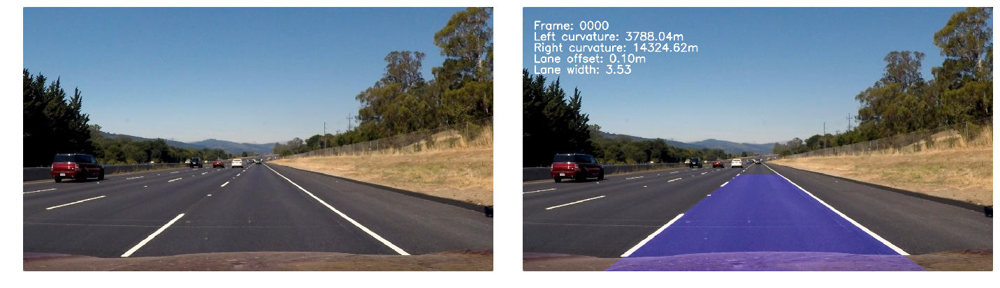

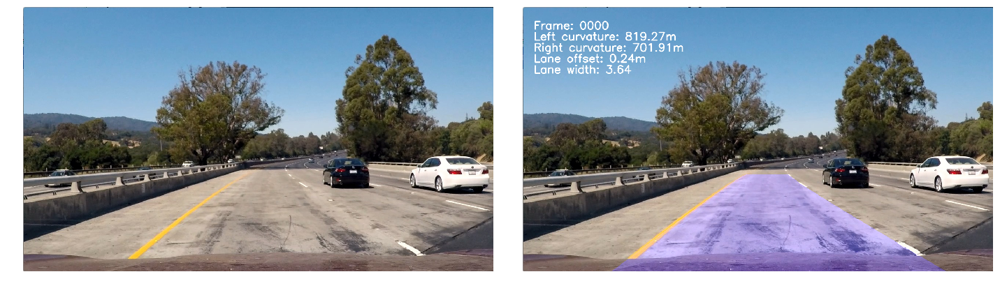

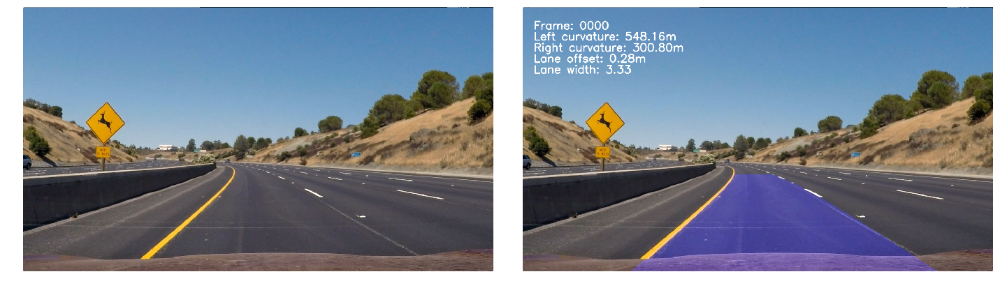

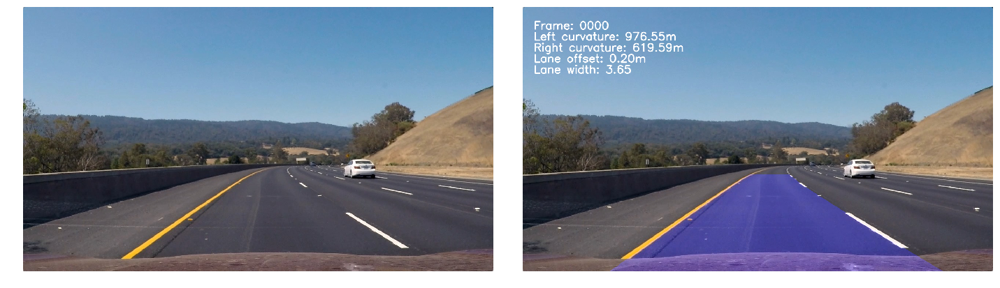

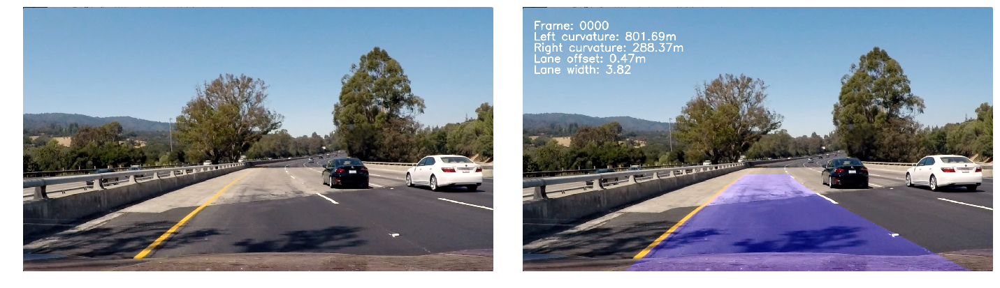

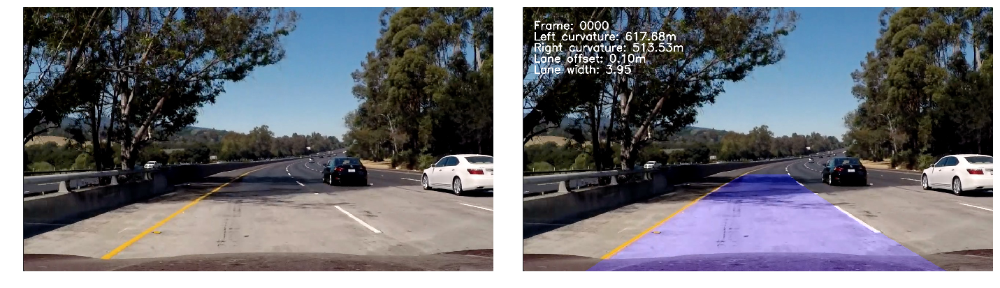

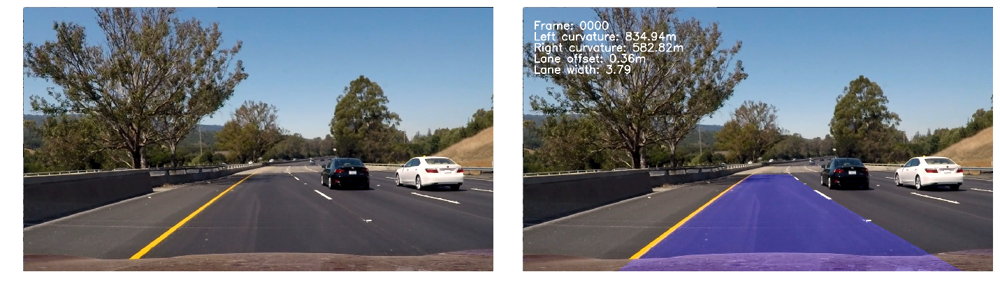

In [51]:
# Show all test images processed

for image in test_images:
    init_lines()
    processed = process_image(image)
    plot_sxs(image, processed)

In [52]:
init_lines()

video_output = 'output_images/project_video_output.mp4'
clip1 = VideoFileClip('project_video.mp4')
clip1_output = clip1.fl_image(process_image)
%time clip1_output.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video output_images/project_video_output.mp4
[MoviePy] Writing video output_images/project_video_output.mp4


100%|█████████▉| 1260/1261 [02:48<00:00,  7.48it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_images/project_video_output.mp4 

CPU times: user 3min 17s, sys: 46.7 s, total: 4min 4s
Wall time: 2min 48s


In [53]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output))

In [54]:
init_lines()

video_challenge_output = 'output_images/project_video_challenge_output.mp4'
clip1 = VideoFileClip('challenge_video.mp4')
clip1_output = clip1.fl_image(process_image)
%time clip1_output.write_videofile(video_challenge_output, audio=False)

[MoviePy] >>>> Building video output_images/project_video_challenge_output.mp4
[MoviePy] Writing video output_images/project_video_challenge_output.mp4


100%|██████████| 485/485 [00:58<00:00,  8.27it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_images/project_video_challenge_output.mp4 

CPU times: user 1min 13s, sys: 13.8 s, total: 1min 27s
Wall time: 59.6 s


In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_challenge_output))

In [ ]:
init_lines()

harder_video_challenge_output = 'output_images/project_video_harder_challenge_output.mp4'
clip1 = VideoFileClip('harder_challenge_video.mp4')
clip1_output = clip1.fl_image(process_image)
%time clip1_output.write_videofile(harder_video_challenge_output, audio=False)

[MoviePy] >>>> Building video output_images/project_video_harder_challenge_output.mp4
[MoviePy] Writing video output_images/project_video_harder_challenge_output.mp4


100%|█████████▉| 1199/1200 [02:51<00:00,  6.88it/s]


In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(harder_video_challenge_output))